# 量子ビットを理解する

In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

## 設定

In [2]:
#|0>と|1>の混合比率設定（0.0~1.0）
brend = 0.5

#|0>から見た|1>の位相のずれ設定（0.0~2.0）(π)
shift_pi=1

## 以降はポチポチするだけ

In [3]:
# 値の設定
if brend == 1.0:
    shift_pi = 0.0
if brend == 0.0:
    shift_pi = 0.0

shift=shift_pi*math.pi

rng = math.pi*(1.0-brend)

a_x = math.sin(rng)*math.cos(shift)
a_y = math.sin(rng)*math.sin(shift)
a_z = math.cos(rng)

w_0 = math.sqrt(brend)
w_1 = math.sqrt(1.0-brend)

print('x,y,z is',round(a_x,2),round(a_y,2),round(a_z,2))

x,y,z is -1.0 0.0 0.0


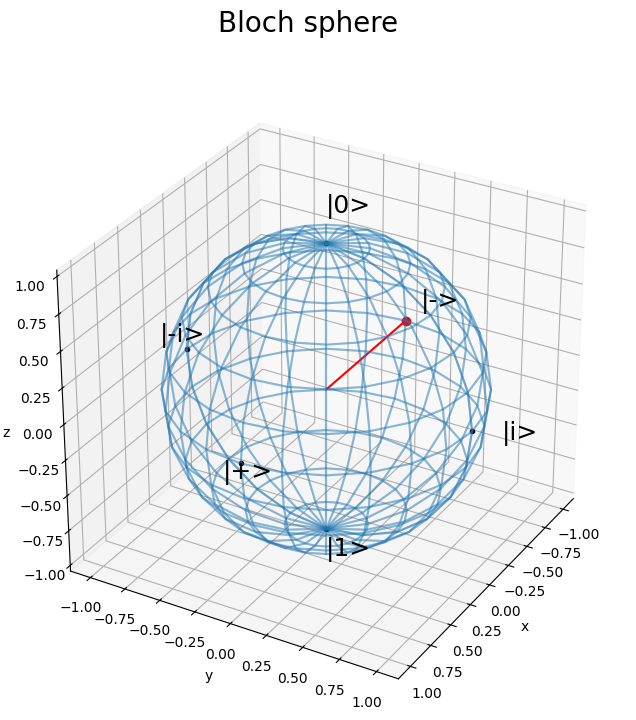

In [4]:
# 描画

# ラジアンを作成
t = np.linspace(start=0.0, stop=2.0*np.pi, num=25)
u = np.linspace(start=0.0, stop=2.0*np.pi, num=25)

# 格子点を作成
T, U = np.meshgrid(t, u)

# 球面の座標を計算
X = np.sin(T) * np.sin(U)
Y = np.sin(T) * np.cos(U)
Z = np.cos(T)
# 球面を作図
fig, ax = plt.subplots(figsize=(8, 8), facecolor='white', 
                       subplot_kw={'projection': '3d'})
ax.plot_wireframe(X, Y, Z, alpha=0.3)

fig.suptitle('Bloch sphere', fontsize=20)
ax.set_aspect('equal')
ax.view_init(elev=30, azim=30)# 視点を設定

ax.set_xlabel('x') 
ax.set_ylabel('y')
ax.set_zlabel('z')


ax.text(0,0,1.2,'|0>',color='black',fontsize=18)
ax.text(0,0,-1.2,'|1>',color='black',fontsize=18)

ax.text(-1.2,0,0,'|->',color='black',fontsize=18)
ax.text(1.2,0,0,'|+>',color='black',fontsize=18)

ax.text(0,1.2,0,'|i>',color='black',fontsize=18)
ax.text(0,-1.2,0,'|-i>',color='black',fontsize=18)

plt.plot(0,0,1,marker='.',color='black')
plt.plot(0,0,-1,marker='.',color='black')

plt.plot(-1,0,0,marker='.',color='black')
plt.plot(1,0,0,marker='.',color='black')

plt.plot(0,1,0,marker='.',color='black')
plt.plot(0,-1,0,marker='.',color='black')


# アローを描画
plt.plot([0,a_x],[0, a_y], [0,a_z], color="red")
plt.plot(a_x,a_y,a_z,marker='o', color="red")

plt.show()

In [5]:
# 値の設定

yo = np.arange(0,2*math.pi,0.01)
xo = np.zeros(yo.shape[0])
zo = np.zeros(yo.shape[0])

x = np.sin(yo)*w_0
z = np.sin(yo-shift)*w_1

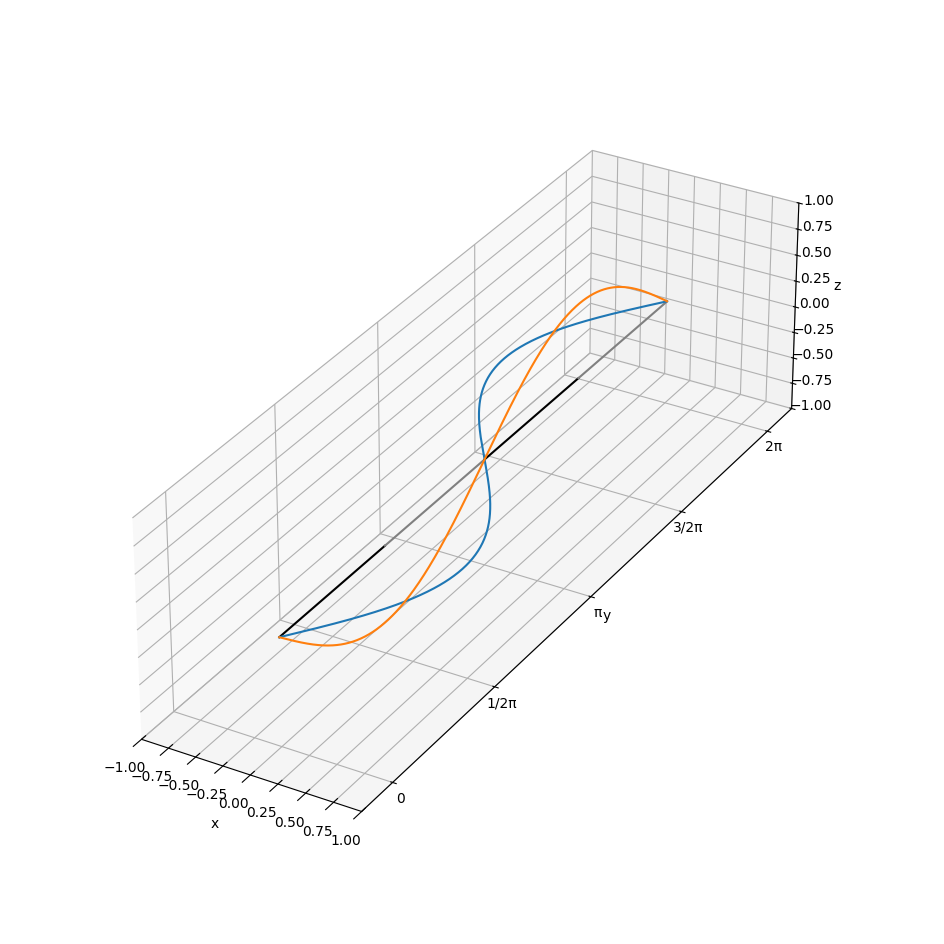

In [6]:
# 描画

fig = plt.figure(figsize=(16,12)) #図のサイズを決定
ax = fig.add_subplot(projection='3d') #3d空間の作成

#各軸に対するラベルの作成
ax.set_xlabel('x') 
ax.set_ylabel('y')
ax.set_zlabel('z')

y1 = np.arange(0,1/2*math.pi,0.01)
x1 = np.zeros(y1.shape[0])
z1 = np.zeros(y1.shape[0])
ax.plot(x1,y1,z1,color='k')
y2 = np.arange(1/2*math.pi,math.pi,0.01)
x2 = np.zeros(y2.shape[0])
z2 = np.zeros(y2.shape[0])
ax.plot(x2,y2,z2,color='gray')
y3 = np.arange(math.pi,3/2*math.pi,0.01)
x3 = np.zeros(y3.shape[0])
z3 = np.zeros(y3.shape[0])
ax.plot(x3,y3,z3,color='k')
y4 = np.arange(3/2*math.pi,2*math.pi,0.01)
x4 = np.zeros(y4.shape[0])
z4 = np.zeros(y4.shape[0])
ax.plot(x4,y4,z4,color='gray')

ax.set_xlim(-1,1)
ax.set_zlim(-1,1)
plt.yticks([0, 1.57,3.14, 4.71,6.28], ["0", "1/2π", "π","3/2π","2π"])
ax.set_aspect('equal')


ax.plot(x,yo,zo)
ax.plot(xo,yo,z)
#ax.plot(x,yo,z)

plt.show()

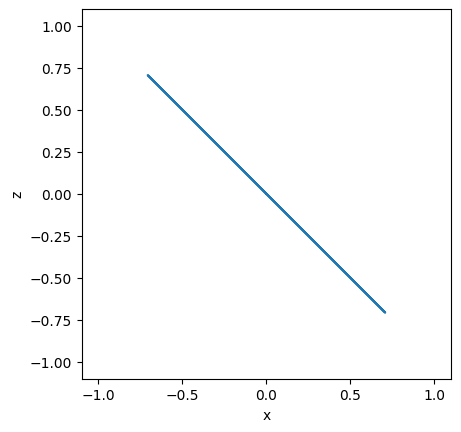

In [7]:
# 描画(アニメーション)

fig, ax = plt.subplots()
xdata, ydata = [], []
ln, = plt.plot([], [])

def init():
    ax.set_xlim(-1.1, 1.1)
    ax.set_ylim(-1.1, 1.1)
    ax.set_xlabel('x') 
    ax.set_ylabel('z')
    ax.set_aspect('equal')
    return ln,

def update(frame):
    xdata.append(x[int(frame)])
    ydata.append(z[int(frame)])
    ln.set_data(xdata, ydata)
    return ln,

ani = FuncAnimation(fig, update, frames=np.linspace(0, 628, 628),init_func=init, blit=True, interval=20)

HTML(ani.to_jshtml())

### アダマールゲートの操作を考える

$$
H =
\frac{1}{\sqrt{2}}
\begin{pmatrix}
1 & 1 \\
1 & -1
\end{pmatrix}
$$

In [8]:
#アダマール変換 (x,z)→(xh,zh)
# やっていること：|1>を反転させ、反時計周りに1/4π回転させる

xh = ( x + z)/2**0.5
zh = ( x - z)/2**0.5

#print(round(max(x),2),round(max(z),2))
#print(round(max(xh),2),round(max(zh),2))

#位相のずれを求める
if max(xh) >= 0.0001:
    for i in range(len(xh)*2):
        if xh[i%len(xh)] < 0.0:
            if xh[(i+1)%len(xh)] >= 0.0:
                break
    for j in range(len(zh)*2):
        if zh[j%len(zh)] < 0.0:
            if zh[(j+1)%len(zh)] >= 0.0:
                break
    shift_pi_ = round(((j-i+len(xh))%len(xh)/len(xh)*2.0),2)
else:
    shift_pi_ = 0.0


print('from max x:',round(max(x)**2,2),'max z:',round(max(z)**2,2))
print('to   max x:',round(max(xh)**2,2),'max z:',round(max(zh)**2,2))

print('shift_pi_ is',shift_pi_)

print(round(max(xh)**2+max(zh)**2,2),'must be 1.0')

from max x: 0.5 max z: 0.5
to   max x: 0.0 max z: 1.0
shift_pi_ is 0.0
1.0 must be 1.0


### 求めた値を反映

In [9]:
brend = max(xh)**2
shift_pi = shift_pi_

#以降、ポチポチを繰り返す